# Predict PV on UK regions

### Setup

In [1]:
# Setup
import pandas as pd
import numpy as np
import datetime as dt

import glob
import os
import itertools
import collections
import re
import json
import requests

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import colour

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# https://matplotlib.org/3.1.0/tutorials/colors/colormap-manipulation.html

from shapely.geometry import Polygon, Point
import geopandas as gpd
import pyproj # Do I need this when I can use geopandas.crs ??
import folium
from folium import Rectangle
from folium import Polygon as f_Polygon
import affine

from tqdm import tqdm # Progress bar stuff cos progress bars are good
tqdm.pandas() # now can use progress_apply instead of apply

import pickle # Pickle stuff, cos pickling is good

# Styles
pd.set_option('display.float_format', lambda x: '%.2f' % x) # pandas
np.set_printoptions(precision=5, suppress=True) # numpy

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

# seaborn plotting style
sns.set(style='ticks', context='poster')

import rasterio
import rasterio.features
from rasterio.crs import CRS
from rasterio.plot import show
from rasterio.warp import transform_bounds

import skimage.io as io
from skimage.io import imread

import cv2

# Charts
def hide_splines(ax):
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

### Utilities
def bng(df):
    # Takes dataframe or geodataframe and converts it to a geodataframe with CRS in British National Grid
    if type(df) != gpd.GeoDataFrame:
        df = gpd.GeoDataFrame(df, crs={'init':'epsg:27700'})
    elif type(df) == gpd.GeoDataFrame:
        df = df.to_crs(crs={'init':'epsg:27700'})
    return df

def wgs(df):
    # Takes dataframe or geodataframe and converts it to a geodataframe with CRS in WGS84
    if type(df) != gpd.GeoDataFrame:
        df = gpd.GeoDataFrame(df, crs={'init':'epsg:4326'})
    elif type(df) == gpd.GeoDataFrame:
        df = df.to_crs(crs={'init':'epsg:4326'})
    return df

In [2]:
base_dir = '/media/mount/data/' # 2015 on external drive

In [18]:
# Get image tileset
images = gpd.GeoDataFrame(pd.read_pickle('data/images_1998-2017.pkl'), crs={'init':'epsg:27700'})
images = images.reset_index(drop=True)

images = images[images.year > 2010]

In [19]:
images.head(1)

,name,lat,lon,geometry,folder,year
23707,/media/mount/data/2011/nm/nm9959_l2_250_01,199000.12,759999.88,"POLYGON ((198999.999 758999.75, 198999.999 759...",nm,2011


## Assemble region tilesets

In [20]:
# get borough information
boroughs = gpd.read_file('data/boroughs_pv_distro.shp')

In [21]:
boroughs.columns

Index(['borough', 'cap', 'MODE1_TYPE', 'price', 'dep_decile', 'employed_r',
       'LAD11NM', 'RUC11', ' Total pop', 'rural_perc', 'geometry'],
      dtype='object')

In [22]:
boroughs[boroughs.borough=='Canterbury']

,borough,cap,MODE1_TYPE,price,dep_decile,employed_r,LAD11NM,RUC11,Total pop,rural_perc,geometry
44,Canterbury,6423.24,5.03,238312.59,6.01,0.65,Canterbury,Urban with City and Town,"151,145",16.80,(POLYGON ((625401.3770000003 163507.8920000009...


In [23]:
len(boroughs.borough.unique())

323

In [24]:
cant_tiles = gpd.sjoin(images, boroughs[boroughs.borough=='Canterbury'])

In [26]:
cant_tiles.head(1)

,name,lat,lon,geometry,folder,year,index_right,borough,cap,MODE1_TYPE,price,dep_decile,employed_r,LAD11NM,RUC11,Total pop,rural_perc
168902,/media/mount/data/2015/tr/tr0564_rgb_250_04,605000.12,164999.87,"POLYGON ((604999.999 163999.745, 604999.999 16...",tr,2015,44,Canterbury,6423.24,5.03,238312.59,6.01,0.65,Canterbury,Urban with City and Town,"151,145",16.80


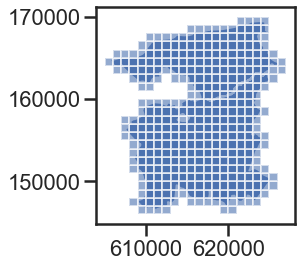

In [50]:
fig, ax = plt.subplots()
boroughs[boroughs.borough=='Canterbury'].geometry.plot(ax=ax)
cant_tiles.plot(ax=ax, alpha=0.6)

In [27]:
knowsley_tiles = gpd.sjoin(images, boroughs[boroughs.borough=='Knowsley'])

In [28]:
knowsley_tiles.head(1)

,name,lat,lon,geometry,folder,year,index_right,borough,cap,MODE1_TYPE,price,dep_decile,employed_r,LAD11NM,RUC11,Total pop,rural_perc
130042,/media/mount/data/2015/sd/sd4001_l2_250_01,340000.12,401999.88,"POLYGON ((339999.999 400999.7500000001, 339999...",sd,2015,142,Knowsley,7964.80,6.25,109529.83,2.74,0.65,Knowsley,Urban with Major Conurbation,"145,893",0.70


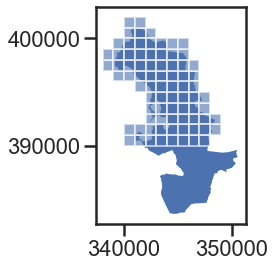

In [43]:
fig, ax = plt.subplots()
boroughs[boroughs.borough=='Knowsley'].geometry.plot(ax=ax)
knowsley_tiles.plot(ax=ax, alpha=0.6)

## Connected-component analysis 

In [13]:
cornwall_tiles = gpd.sjoin(images, boroughs[boroughs.borough=='Cornwall'])

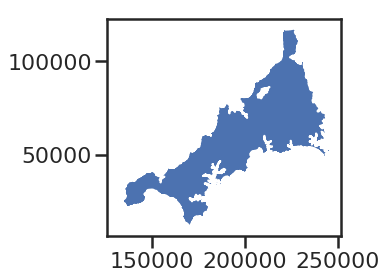

In [14]:
boroughs[boroughs.borough=='Cornwall'].plot()

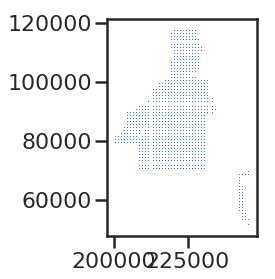

In [15]:
cornwall_tiles[cornwall_tiles['year']==2015].plot()

In [16]:
liverpool_tiles = gpd.sjoin(images, boroughs[boroughs.borough=='Liverpool'])

In [30]:
cambridge_tiles = gpd.sjoin(images, boroughs[boroughs.borough=='Cambridge'])

In [31]:
cambridge_tiles.head(1)

,name,lat,lon,geometry,folder,year,index_right,borough,cap,MODE1_TYPE,price,dep_decile,employed_r,LAD11NM,RUC11,Total pop,rural_perc
239743,/media/mount/data/2017/tl/tl4158_rgb_250_05,541000.12,258999.87,"POLYGON ((540999.999 257999.745, 540999.999 25...",tl,2017,41,Cambridge,3704.21,4.83,350265.49,6.71,0.71,Cambridge,Urban with City and Town,"123,867",0.30


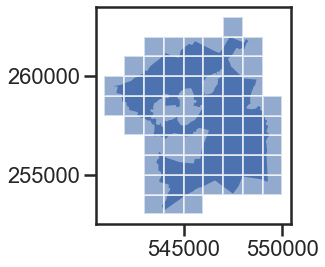

In [49]:
fig, ax = plt.subplots()
boroughs[boroughs.borough=='Cambridge'].geometry.plot(ax=ax)
cambridge_tiles.plot(ax=ax, alpha=0.6)

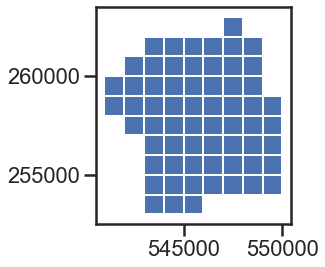

In [32]:
cambridge_tiles.plot()

In [19]:
# LSOA shapefiles and ID
lsoa = gpd.read_file('../../../Dropbox/ESDA/Spatial/Coursework/data/Lower_Layer_Super_Output_Areas_December_2011_Generalised_Clipped__Boundaries_in_England_and_Wales/Lower_Layer_Super_Output_Areas_December_2011_Generalised_Clipped__Boundaries_in_England_and_Wales.shp')

lsoa = lsoa[['lsoa11cd', 'lsoa11nm', 'geometry']]
lsoa.columns = ['lsoa', 'lsoa11nm', 'geometry']

In [20]:
lsoa['borough'] = [' '.join(x.split(' ')[:-1]) for x in lsoa.lsoa11nm]

In [21]:
boroughs_2 = lsoa.dissolve('borough')

In [22]:
boroughs_2 = boroughs_2.reset_index()

In [23]:
boroughs_2[boroughs_2.borough=='Bristol']

,borough,geometry,lsoa,lsoa11nm
35,Bristol,(POLYGON ((352025.3119999999 176583.1089999992...,E01014485,Bristol 023A


In [24]:
bristol_tiles = gpd.sjoin(images, boroughs_2[boroughs_2.borough=='Bristol'])

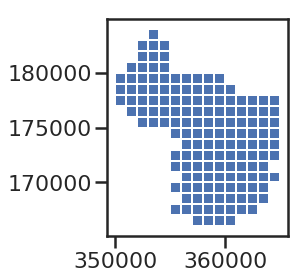

In [25]:
bristol_tiles.plot()

In [26]:
rotherham_tiles = gpd.sjoin(images, boroughs_2[boroughs_2.borough=='Rotherham'])

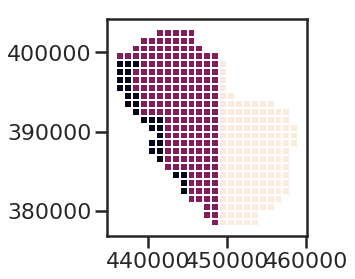

In [27]:
rotherham_tiles.plot(column='year')

In [28]:
manchester_tiles = gpd.sjoin(images, boroughs_2[boroughs_2.borough=='Manchester'])

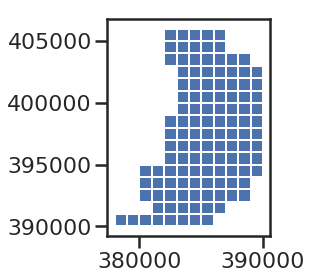

In [29]:
manchester_tiles.plot()

In [30]:
peterborough_tiles = gpd.sjoin(images, boroughs_2[boroughs_2.borough=='Peterborough'])

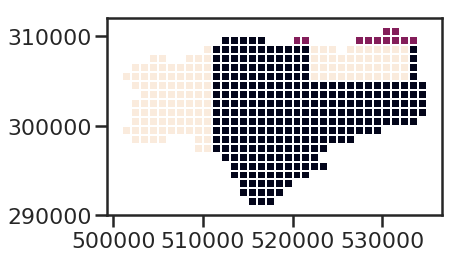

In [31]:
peterborough_tiles.plot(column='year')

In [32]:
# import shutil
# dest = '/home/laurence/projects/raster-vision-fastai-plugin/data/true/knowsley/' 

# for name in knowsley_tiles.name.values:
#     shutil.copy(name + '.jpg', dest + name.split('/')[-1] + '.jpg')
#     shutil.copy(name + '.jgw', dest + name.split('/')[-1] + '.jgw')

In [33]:
# import shutil
# dest = '/home/laurence/projects/raster-vision-fastai-plugin/data/true/liverpool/' 

# for name in liverpool_tiles.name.values:
#     shutil.copy(name + '.jpg', dest + name.split('/')[-1] + '.jpg')
#     shutil.copy(name + '.jgw', dest + name.split('/')[-1] + '.jgw')

In [34]:
# import shutil
# dest = '/home/laurence/projects/raster-vision-fastai-plugin/data/true/peterborough/' 

# for name in peterborough_tiles.name.values:
#     shutil.copy(name + '.jpg', dest + name.split('/')[-1] + '.jpg')
#     shutil.copy(name + '.jgw', dest + name.split('/')[-1] + '.jgw')

# Check results

In [83]:
def plot_pred(image_id, exp_id='duke_seg3', town='knowsley', save=False, win=[0, 0, 5000, 5000], axes=False):
    """Image id eg 11ska565830
    Experiment name to choose correct folder
    Save - save an image or not with experiment id, image id and window dimensions
    Window to read in # startx, starty, lenx, leny
    # win = [4000, 4000, 300, 300] # default
    axes on or off
    """

    src = f'/home/laurence/projects/raster-vision-fastai-plugin/data/true/{town}/{image_id}.jpg'
    img = f'/home/laurence/projects/raster-vision-fastai-plugin/data/true/{town}_preds/{image_id}.tif'
    window = rasterio.windows.Window(*win)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    ax1.set_title('Prediction', fontsize=16)
    ax2.set_title('Image', fontsize=16)
    print(image_id)
    
    with rasterio.open(src) as src:
        with rasterio.open(img) as pred:
            show(src.read(window=window), ax=ax1)
            show(pred.read(window=window), alpha=0.8, ax=ax1)
            show(src.read(window=window), ax=ax2)
#     ax1.set_yticks([0, 1000, 2000, 3000, 4000, 5000])
    
    ax1.axis('off')
    ax2.axis('off')
    # Flip y axis 
#     for ax in (ax1, ax2):    
#         ax.set_ylim(ax.get_ylim()[::-1])
        
    hide_splines(ax1)
    
    if save:
        plt.savefig(f'img/chart_{exp_id}_{town}_{image_id}_{"_".join([str(x) for x in win])}.png', bbox_inches='tight', dpi=300)    
#     return

sd4100_l2_250_01


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


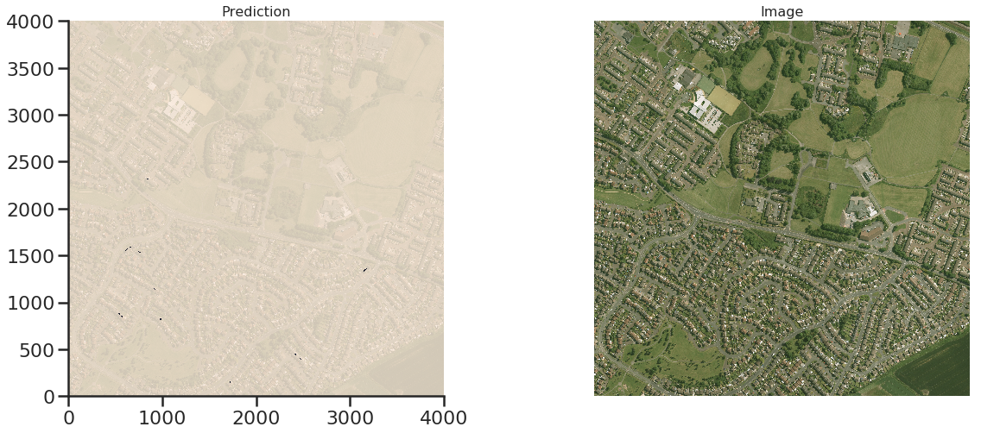

In [74]:
plot_pred('sd4100_l2_250_01', save=True)

sd4100_l2_250_01


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


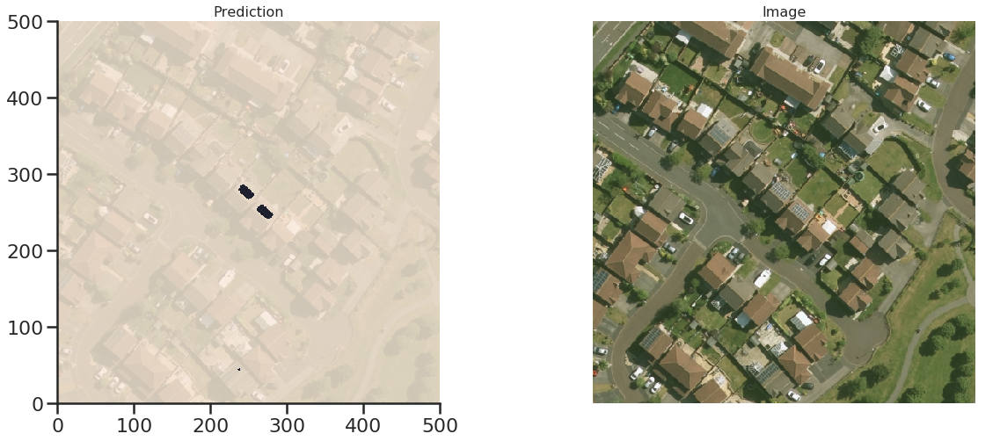

In [75]:
plot_pred('sd4100_l2_250_01', win=[300, 600, 500, 500], save=True)

sd4100_l2_250_01


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


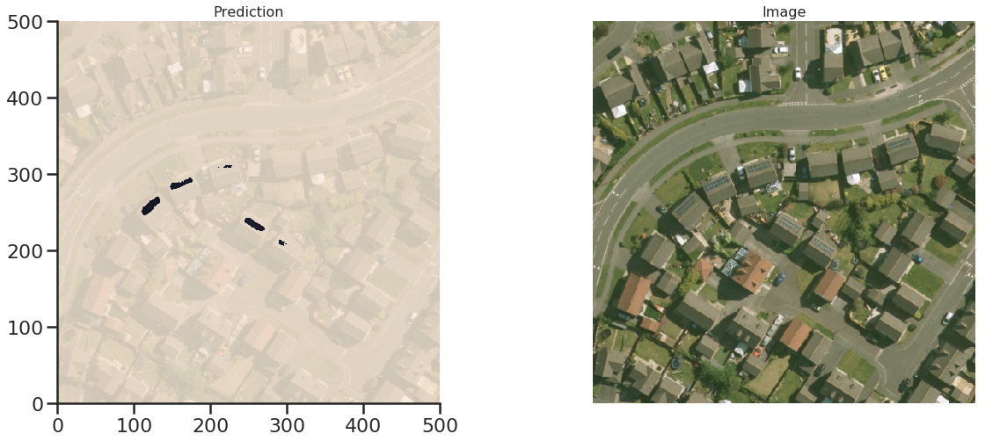

In [76]:
plot_pred('sd4100_l2_250_01', win=[500, 1300, 500, 500], save=True)

sj3998_l2_250_01


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


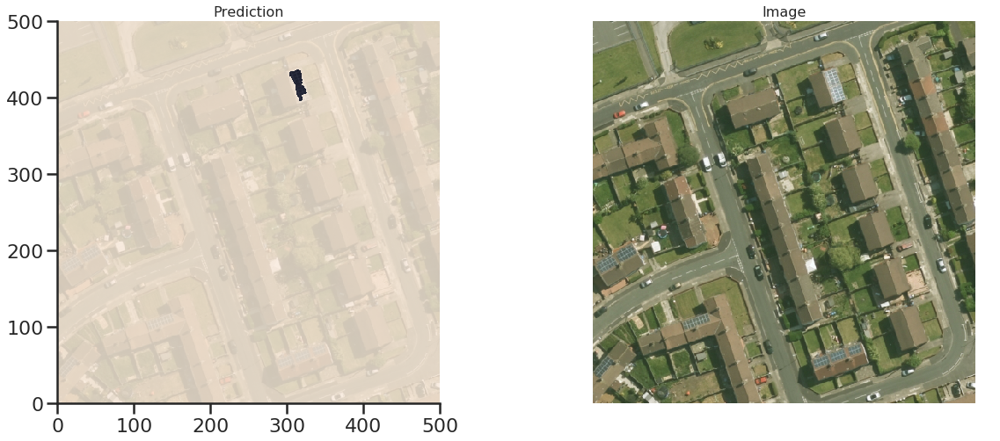

In [77]:
# plot_pred('sj3998_l2_250_01')
plot_pred('sj3998_l2_250_01', win=[3500, 100, 500, 500], save=True)

sj4295_l2_250_01


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


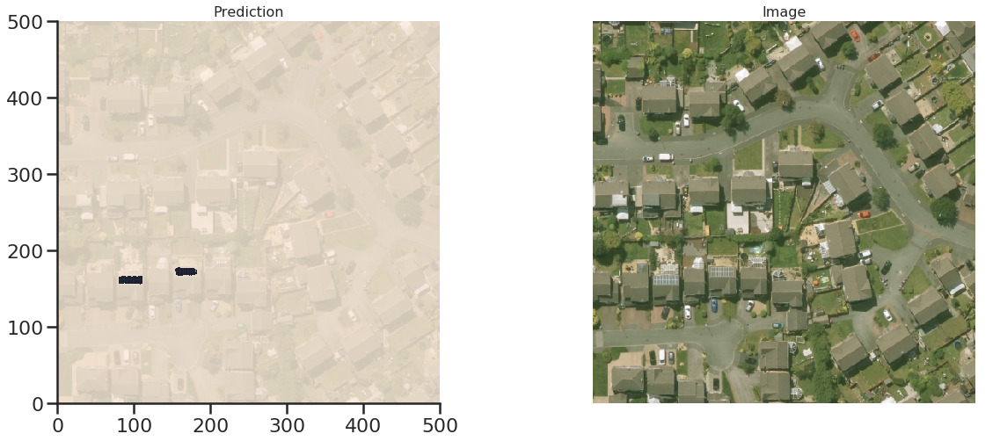

In [78]:
plot_pred('sj4295_l2_250_01', win=[0, 2300, 500, 500], save=True)

sj4199_l2_250_01


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


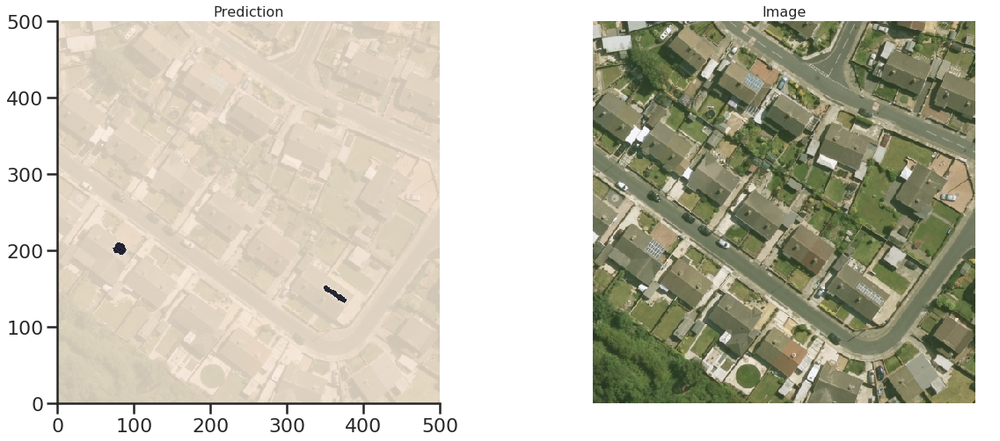

In [79]:
plot_pred('sj4199_l2_250_01', win=[200, 2000, 500, 500], save=True)

# Calculate statistics

Use connected-components  
http://scipy-lectures.org/packages/scikit-image/auto_examples/plot_labels.html

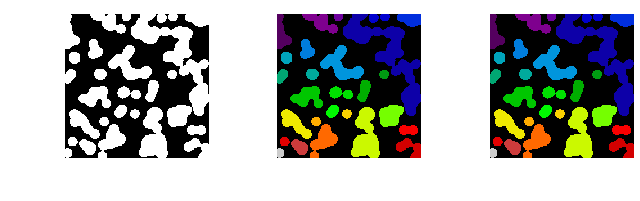

In [11]:
from skimage import measure
from skimage import filters
import matplotlib.pyplot as plt
import numpy as np

n = 12
l = 256
np.random.seed(1)
im = np.zeros((l, l))
points = l * np.random.random((2, n ** 2))
im[(points[0]).astype(np.int), (points[1]).astype(np.int)] = 1
im = filters.gaussian(im, sigma= l / (4. * n))
blobs = im > 0.7 * im.mean()

all_labels = measure.label(blobs)
blobs_labels = measure.label(blobs, background=0)

plt.figure(figsize=(9, 3.5))
plt.subplot(131)
plt.imshow(blobs, cmap='gray')
plt.axis('off')
plt.subplot(132)
plt.imshow(all_labels, cmap='nipy_spectral')
plt.axis('off')
plt.subplot(133)
plt.imshow(blobs_labels, cmap='nipy_spectral')
plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
town = 'knowsley'
image_id = 'sd4100_l2_250_01'
pred = f'/home/laurence/projects/raster-vision-fastai-plugin/data/true/{town}_preds/{image_id}.tif'
orig = f'/home/laurence/projects/raster-vision-fastai-plugin/data/true/{town}/{image_id}.jpg'

src = rasterio.open(orig)
pred = rasterio.open(pred)
im = pred.read(1)
# im = filters.gaussian(im, sigma= l / (4. * n))

# blobs = im > 0.8 * im.mean()

# all_labels = measure.label(blobs)
# blobs_labels = measure.label(blobs, background=0)

/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [13]:
pd.DataFrame(blobs_labels.reshape(-1)).sum(), len(blobs_labels.reshape(-1))

(0    15997286
 dtype: int64, 16000000)

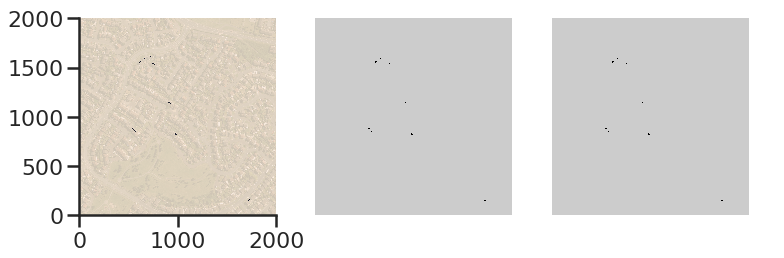

In [14]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,8))
show(src.read()[:2000, :2000], ax=ax1)
show(pred.read(1)[:2000, :2000], alpha=0.8, ax=ax1)

# show(im[:2000, :2000], ax=ax2)
# show(blobs[:2000, :2000], cmap='gray', ax=ax1)
show(all_labels[:2000, :2000], cmap='nipy_spectral', ax=ax2)
show(blobs_labels[:2000, :2000], cmap='nipy_spectral', ax=ax3)
# ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
hide_splines(ax1)
# Flip y axis 
for ax in (ax1, ax2, ax3):    
    ax.set_ylim(ax.get_ylim()[::-1])

In [3]:
array = np.fromfile('data/np_pred.npy')

In [20]:
blobs_labels == 1

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [8]:
np.load('data/np_pred.npy') == 1 

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


The number of foreground pixels is 20 and the size of the box is 30.
The number of foreground pixels is 241 and the size of the box is 441.
The number of foreground pixels is 369 and the size of the box is 783.
The number of foreground pixels is 246 and the size of the box is 441.
The number of foreground pixels is 11 and the size of the box is 25.
The number of foreground pixels is 292 and the size of the box is 462.
The number of foreground pixels is 232 and the size of the box is 418.
The number of foreground pixels is 224 and the size of the box is 399.
The number of foreground pixels is 208 and the size of the box is 450.
The number of foreground pixels is 499 and the size of the box is 1296.
The number of foreground pixels is 44 and the size of the box is 88.
The number of foreground pixels is 212 and the size of the box is 494.
The number of foreground pixels is 274 and the size of the box is 600.
The number of foreground pixels is 200 and the size of the box is 480.
The number 

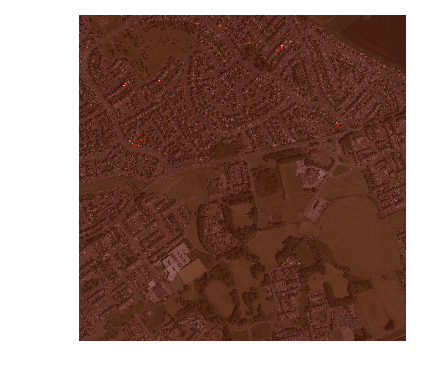

In [9]:
from skimage import measure
from skimage import filters
import matplotlib.pyplot as plt
import numpy as np
from skimage.morphology import closing, square
from skimage.color import label2rgb
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
import matplotlib.patches as mpatches

town = 'knowsley'
image_id = 'sd4100_l2_250_01'
pred = f'/home/laurence/projects/raster-vision-fastai-plugin/data/true/{town}_preds/{image_id}.tif'
orig = f'/home/laurence/projects/raster-vision-fastai-plugin/data/true/{town}/{image_id}.jpg'

src = rasterio.open(orig)

pred = rasterio.open(pred)
im = pred.read(1)

# your file: I am binarising your slightly weird labels (now 0 is background)
# image = np.load('/Users/zeatonro/Downloads/np_pred.npy') == 1 
# image = np.load('data/np_pred.npy') == 1 
image = im == 1

# figure out the threhold using an otsu filtering 
thresh = threshold_otsu(image)

# i am not exactly sure what the square parameter does
bw = closing(image > thresh, square(3))

# remove artifacts connected to image border
cleared = clear_border(bw)

# label image regions
label_image = label(cleared) # at this point, you will get a map with a different colour for each. 
image_label_overlay = label2rgb(label_image, image=image)

fig, ax = plt.subplots(figsize=(10, 6))
show(src.read(), ax=ax)
ax.imshow(image_label_overlay, alpha=0.6)

# regionprops probably has other useful things. 
for region in regionprops(label_image):
    # take regions with large enough areas  
    if region.area > 4: # you can change this  
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        
        area, bounding_box_area = region.area, (maxc - minc) * (maxr - minr)
        print(f"The number of foreground pixels is {area} and the size of the box is {bounding_box_area}.")
        
        rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=0.5)
        ax.add_patch(rect)
ax.set_axis_off()
plt.savefig('img/chart_prediction_boxes.png', bounding_box='tight', dpi=150)

### Turn into function and deploy on prediction folders

In [59]:
town = 'knowsley'
image_id = 'sd4100_l2_250_01'

In [2]:
def get_preds(town):
    base_uri = '/home/laurence/projects/raster-vision-fastai-plugin/data/true/'
    predictions = glob.glob(base_uri + f'{town}_preds/*tif')
    
    results = []
    
    for file in predictions:
        im = rasterio.open(file).read(1)
        image = im == 1
        try:
            thresh = threshold_otsu(image)
            bw = closing(image > thresh, square(3))
            cleared = clear_border(bw)
            label_image = label(cleared) # at this point, you will get a map with a different colour for each. 
            image_label_overlay = label2rgb(label_image, image=image)

            # regionprops probably has other useful things. 
            for region in regionprops(label_image):
                if region.area > 4: # you can change this  
                    # draw rectangle around segmented coins
                    minr, minc, maxr, maxc = region.bbox       
                    area, bounding_box_area = region.area, (maxc - minc) * (maxr - minr)
    #                 print(f"The number of foreground pixels is {area} and the size of the box is {bounding_box_area}.")
                    results.append([town, file.split('/')[-1].strip('.tif'), area])
            print(f'Counted predictions in {file}, {town}')
        except:
            continue
    return results

In [39]:
cambridge = get_preds('cambridge')

/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4856_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4659_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4655_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4258_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4755_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4855_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4759_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4553_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4754_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4355_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4657_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4958_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4658_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4758_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4461_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4654_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4259_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4358_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4561_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4661_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4158_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4455_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4560_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4359_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4454_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4459_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4457_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4859_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4556_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4860_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4361_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4762_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4458_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4858_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4761_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4756_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4559_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4660_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4760_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4555_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4453_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4956_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4460_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4957_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4260_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4360_rgb_250_04.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4656_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4558_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4557_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4354_rgb_250_06.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4857_rgb_250_05.tif, cambridge


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Counted predictions in /home/laurence/projects/raster-vision-fastai-plugin/data/true/cambridge_preds/tl4757_rgb_250_05.tif, cambridge


In [126]:
# Run on all folders
# towns = ['bristol' 'cambridge'] # cant', 'knowsley', 'liverpool', 'manchester', 'peterborough']
# output3 = [] 

# for town in towns:
#     output2.append(get_preds(town))

In [52]:
cambridge = pd.DataFrame(cambridge, columns= ['town', 'id', 'pixels'])
# cant

In [56]:
# results = pd.concat([results, cambridge])

In [114]:
# a = output[1]
# b= output[2]
# c= output[3]
# d= output[4]
# results = pd.concat([pd.DataFrame(a),pd.DataFrame(b),pd.DataFrame(c),pd.DataFrame(d)])

# results.columns = ['town', 'id', 'pixels']

In [58]:
# results.to_pickle('data/pred_counts.pkl')

In [54]:
# results = results[results.town != 'cambridge']

In [7]:
results = pd.read_pickle('data/pred_counts.pkl')

In [12]:
watts = 181.8 / 1000 # kW in 1m2

In [16]:
results\
    .assign(capacity = lambda x: 0.001 * watts * x.pixels / 16)\
    .assign(mean_capacity = lambda x: watts * x.pixels / 16)\
    .assign(median_capacity = lambda x: watts * x.pixels / 16)\
    .groupby('town')\
    .agg({'id': 'count', 'capacity': 'sum', 'mean_capacity': 'mean', 'median_capacity': 'median'})

,id,capacity,mean_capacity,median_capacity
town,,,,
bristol,2423,27.33,11.28,1.97
cambridge,3764,13.43,3.57,0.95
cant,31,0.47,15.26,6.35
knowsley,518,1.52,2.93,1.45
liverpool,277,1.20,4.34,1.39
manchester,673,2.62,3.89,1.91
peterborough,906,4.10,4.52,1.62


OSM and FIT
bristol 	45	4129
Cambridge 74 / 1320
Knowsley # 1808	2727  
Liverpool 1962	3244   
Manchester 1630	6527  
Peterborough 4638	8896

There are fuckloads in cambridge... we need to inspect...  
probably some fucking solar farms 

In [100]:
results[results.town=='bristol']\
    .assign(area = lambda x: x.pixels / 16)\
    .assign(mean_area = lambda x: x.pixels / 16)\
    .assign(count = lambda x: x.pixels)\
    .groupby('id')\
    .agg({'count':'count', 'area': 'sum', 'mean_area': 'mean'})\
    .sort_values('area', ascending=False).reset_index().head()

,id,count,area,mean_area
0,st5079_rgb_250_06,74,16380.19,221.35
1,st5479_rgb_250_06,51,16117.00,316.02
2,st5381_rgb_250_08,32,11514.94,359.84
3,st5279_rgb_250_06,42,11436.19,272.29
4,st5378_rgb_250_05,28,6572.56,234.73


tl4454_rgb_250_06


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


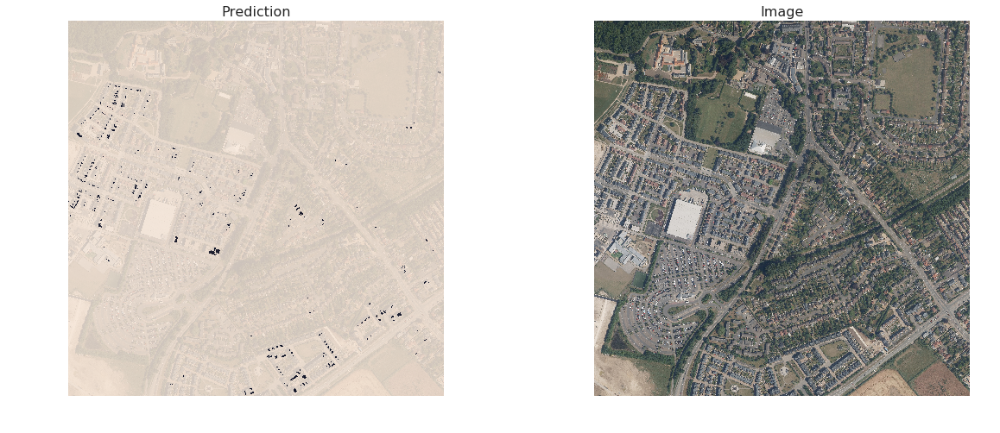

In [84]:
plot_pred('tl4454_rgb_250_06', town='cambridge', save=True, win=[0, 0, 5000, 5000], axes=False)

tl4558_rgb_250_05


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


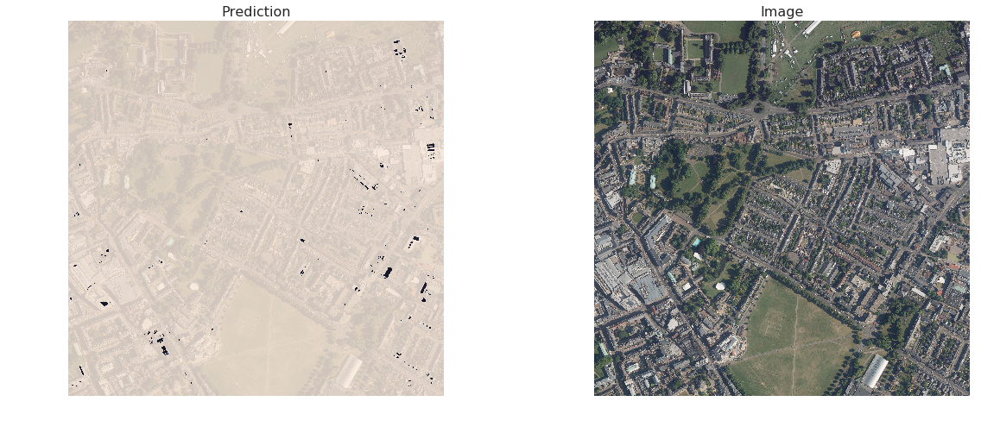

In [85]:
plot_pred('tl4558_rgb_250_05', town='cambridge', save=True)
# do final 500x first 500 y ... want top right corner

st5479_rgb_250_06


/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


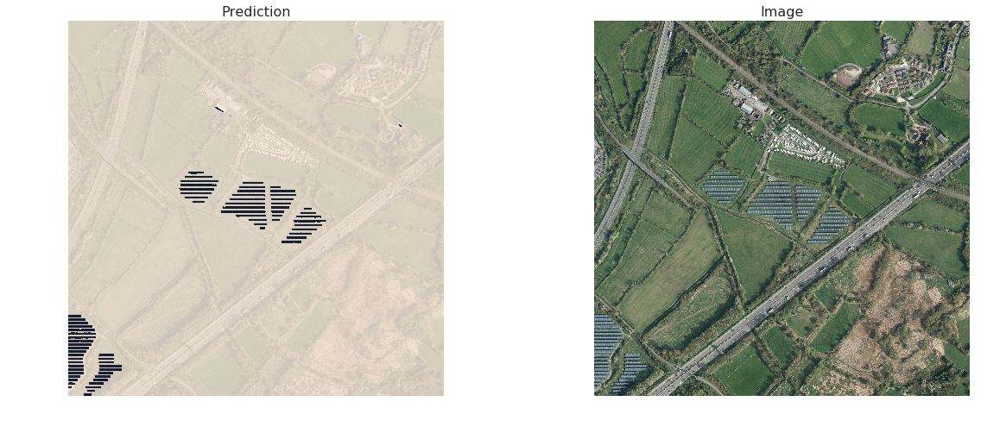

In [104]:
plot_pred('st5479_rgb_250_06', save=True, town='bristol')